# Imports

You could install required library using code below:

In [1]:
#!pip install "library_name"

We don't like warnings and try to ignore them.

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# data processing
import numpy as np
import pandas as pd 

# visualization tools
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
sns.set_style("darkgrid")
import plotly.graph_objects as go
import plotly.express as px
import folium
from folium.plugins import HeatMap
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

import missingno as msno
%config InlineBackend.figure_format = 'png'

# Reading Data

In [4]:
df = pd.read_csv('vehicles.csv')
df.shape

(509577, 25)

We have almost half a million observations.

In [5]:
df.sample(3)

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,drive,size,type,paint_color,image_url,description,county,state,lat,long
54774,7049308485,https://bham.craigslist.org/cto/d/atlanta-2014...,birmingham,https://bham.craigslist.org,19995,2014.0,toyota,tundra crewmax,excellent,8 cylinders,...,rwd,full-size,truck,black,https://images.craigslist.org/00n0n_cjKeipmx7B...,Reliable and good looking truck for sale! Cr...,NaN,al,33.7865,-84.4454
306690,7035156557,https://stcloud.craigslist.org/ctd/d/miltona-2...,st cloud,https://stcloud.craigslist.org,6500,2005.0,chevrolet,avalanche crew cab z71,good,8 cylinders,...,4wd,full-size,truck,red,https://images.craigslist.org/00e0e_6lkVGB62xa...,2005 Chevrolet Avalanche 1500 5dr Crew Cab 130...,NaN,mn,46.1166,-95.3235
33337,7048791376,https://martinsburg.craigslist.org/ctd/d/marti...,eastern panhandle,https://martinsburg.craigslist.org,41800,2018.0,mercedes-benz,glc300 4matic,excellent,NaN,...,NaN,NaN,NaN,NaN,https://images.craigslist.org/01010_cgAmD7mwXm...,ð±Text or call (304) 396-1800 2018 Mercede...,NaN,wv,39.4567,-77.9727


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509577 entries, 0 to 509576
Data columns (total 25 columns):
id              509577 non-null int64
url             509577 non-null object
region          509577 non-null object
region_url      509577 non-null object
price           509577 non-null int64
year            508050 non-null float64
manufacturer    486813 non-null object
model           501588 non-null object
condition       277643 non-null object
cylinders       309894 non-null object
fuel            505592 non-null object
odometer        417253 non-null float64
title_status    506515 non-null object
transmission    505858 non-null object
vin             302152 non-null object
drive           365434 non-null object
size            167574 non-null object
type            368046 non-null object
paint_color     344871 non-null object
image_url       509563 non-null object
description     509561 non-null object
county          0 non-null float64
state           509577 non-null obj

### Check for NaN values

In [7]:
df.isna().sum()

id                   0
url                  0
region               0
region_url           0
price                0
year              1527
manufacturer     22764
model             7989
condition       231934
cylinders       199683
fuel              3985
odometer         92324
title_status      3062
transmission      3719
vin             207425
drive           144143
size            342003
type            141531
paint_color     164706
image_url           14
description         16
county          509577
state                0
lat              10292
long             10292
dtype: int64

We have a lot of missing values. Now we would like to show the data structure.

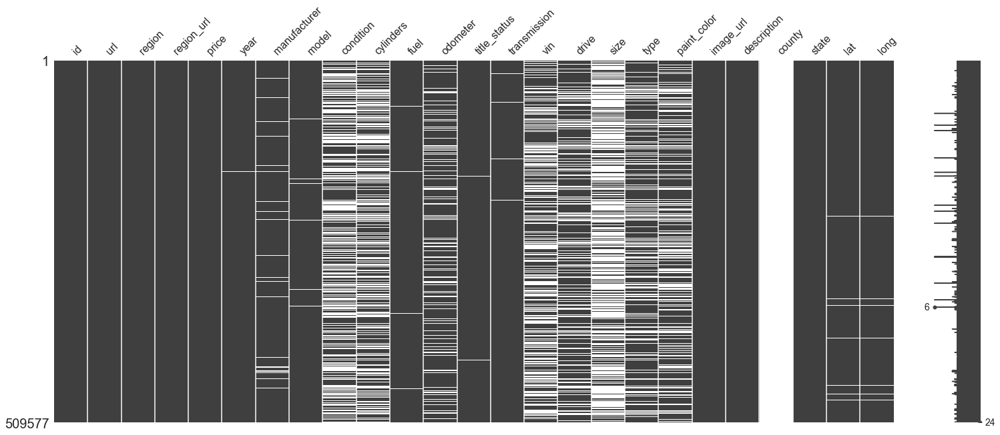

In [8]:
msno.matrix(df)
plt.show()

In [9]:
%config InlineBackend.figure_format = 'svg'

Original dataset has useless columns.

In [10]:
df.columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'vin', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long'],
      dtype='object')

In [11]:
df.drop(columns=['vin', 'url', 'image_url', 'region_url', 'size', 'county'], inplace=True)

## Drop NaN

In [12]:
df.dropna(inplace=True)
df.shape

(139969, 19)

# Exploring features

## 1. Price

In [13]:
print('Top 10 most used price points:')
print(df['price'].value_counts().iloc[:10])

Top 10 most used price points:
0       5854
1       1790
4500    1655
3500    1642
6995    1589
5995    1511
2500    1474
5500    1383
4995    1360
7995    1344
Name: price, dtype: int64


In [14]:
df.price.describe() / 10000

count        13.996900
mean          7.292457
std        1373.848715
min           0.000000
25%           0.420000
50%           0.840000
75%           1.590000
max      360002.890000
Name: price, dtype: float64

In [15]:
df[['price']].sort_values(ascending=False, by='price').head()

,price
345972,3600028900
264595,3567587328
496917,831365932
183054,123456789
3509,123456789


The boxplot of price feature

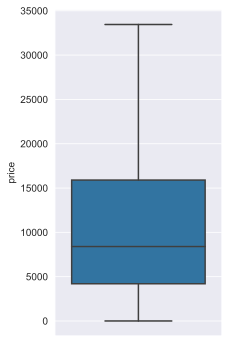

In [16]:
plt.figure(figsize=(3,6))
sns.boxplot(y='price', data=df,showfliers=False);

We see that data has many obvious outliers, later we will clean them.

## 2. Region

In [17]:
print('Number of regions: {}'.format(df['region'].nunique()))
print('Top 10 regions: ')
print (df['region'].value_counts().iloc[:10])

Number of regions: 401
Top 10 regions: 
vermont          1538
rochester        1307
jacksonville     1241
louisville       1232
springfield      1230
albany           1227
tulsa            1176
daytona beach    1098
boston           1091
indianapolis     1084
Name: region, dtype: int64


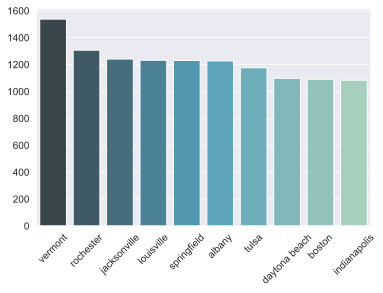

In [18]:
g = sns.barplot(x=df['region'].value_counts().iloc[:10].index, 
                y=df['region'].value_counts().iloc[:10].values,
                palette="GnBu_d")
g.set_xticklabels(g.get_xticklabels(), rotation=45);

## 3. Year

In [19]:
print ('Top 10 car manufacturing years:')
print (df['year'].value_counts().iloc[:10])

Top 10 car manufacturing years:
2013.0    9945
2012.0    9830
2015.0    9496
2014.0    9240
2011.0    9156
2008.0    9112
2016.0    8998
2007.0    7959
2010.0    7571
2006.0    7244
Name: year, dtype: int64


There are few cars which were produced before 1975. We would like to show more modern cars.

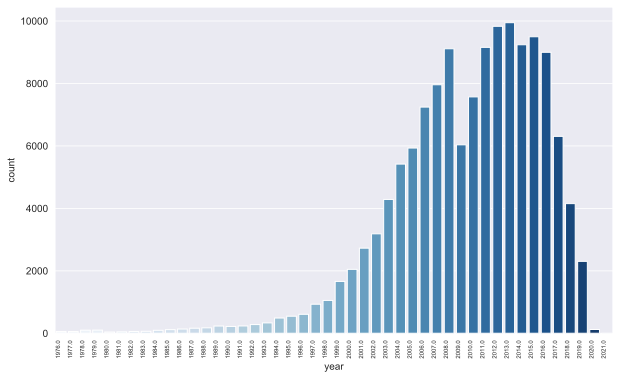

In [20]:
plt.figure(figsize=(10,6))
ax = sns.countplot(x='year',data=df.loc[df['year'] > 1975], palette="Blues");
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right",fontsize=6);

## 4. Manufacturer

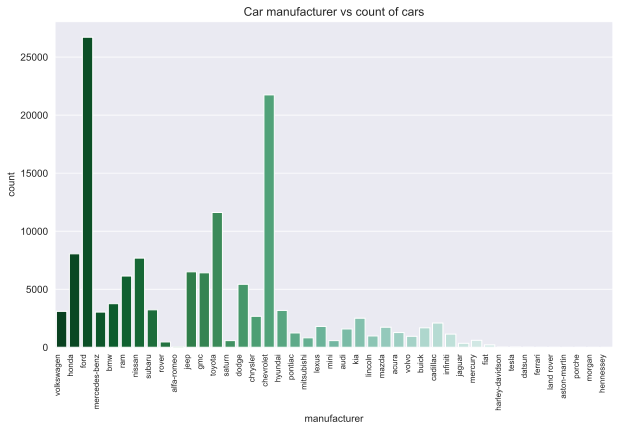

In [21]:
pal = "BuGn_r"
plt.figure(figsize=(10,6))
ax = sns.countplot(x='manufacturer',data=df, palette=pal);
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right",fontsize=8);
plt.title("Car manufacturer vs count of cars");

This plot show average car price of different manufactures. Black line is maximum price.

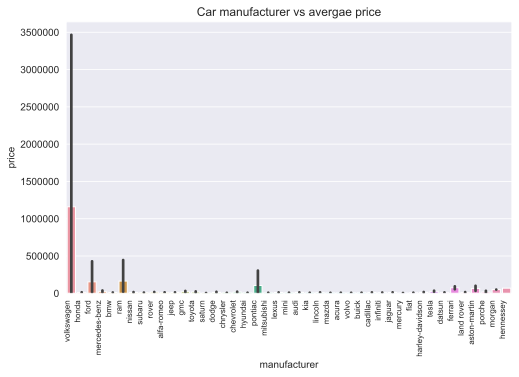

In [22]:
plt.figure(figsize=(8,5))
ax = sns.barplot(x='manufacturer', y='price', data=df);
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right",fontsize=8);
plt.title("Car manufacturer vs avergae price");

We see that Volkswagen, Ford, Ram and Pontiac have relatively high prices.

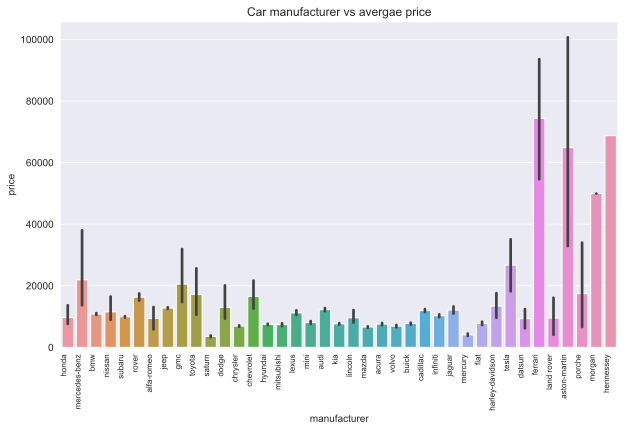

In [23]:
a = df.loc[(df.manufacturer != 'volkswagen')
         & (df.manufacturer != 'ram')
         & (df.manufacturer != 'pontiac') 
         & (df.manufacturer != 'ford')]
plt.figure(figsize=(10,6))
ax = sns.barplot(x='manufacturer', y='price', data=a);
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right",fontsize=8);
plt.title("Car manufacturer vs avergae price");

## 5. Color

In [24]:
x = df.type
y = df.paint_color

fig = go.Figure(go.Histogram2d(
        x=x,
        y=y
    ))
fig.show()

Heatmap for the year and color.

In [25]:
reduced_cars_year_color = df[['paint_color', 'year']]
reduced_cars_year_color['year'] = reduced_cars_year_color['year'].astype('int')
table2 = pd.pivot_table(reduced_cars_year_color, values='paint_color',index='year', 
                        columns='paint_color', aggfunc=len)

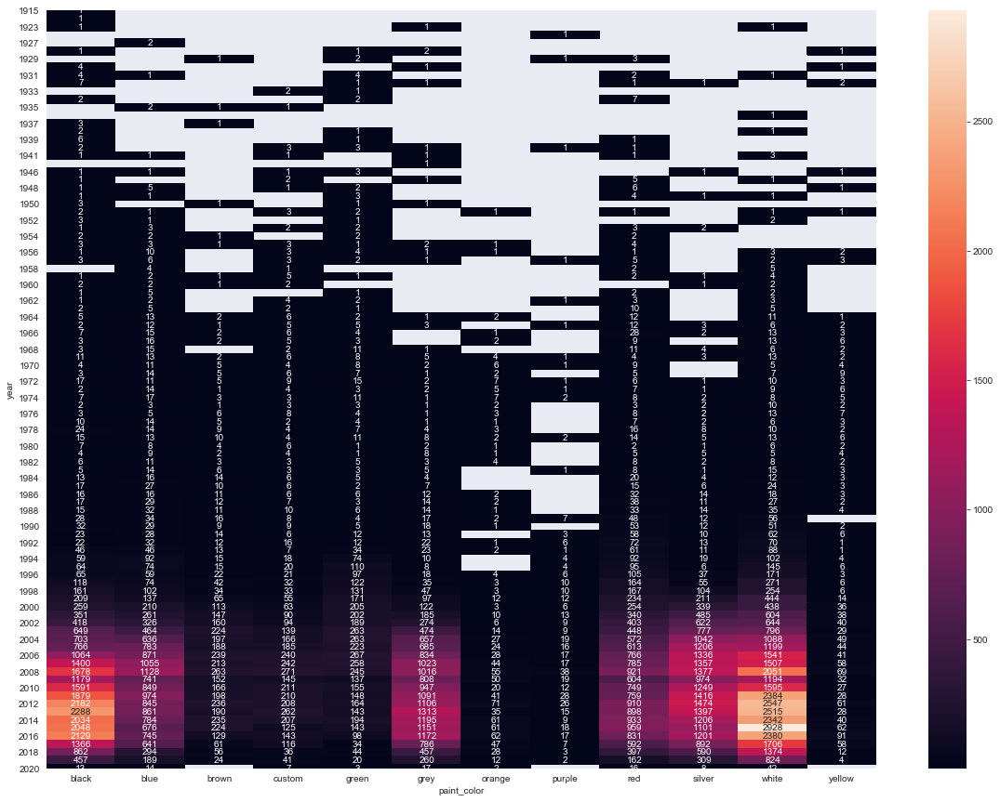

In [26]:
plt.figure(figsize=(20, 15))
sns.heatmap(table2, annot=True, fmt='g');
%config InlineBackend.figure_format = 'png'

## 6. Condition of cars

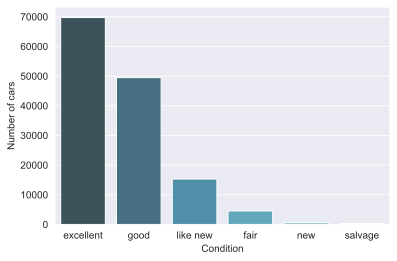

In [27]:
sns.countplot(x='condition', order=df.condition.value_counts().index, data=df, palette="GnBu_d")
plt.xlabel('Condition')
plt.ylabel('Number of cars');
%config InlineBackend.figure_format = 'svg'

Heatmap for the condition and manufacturer columns.

In [28]:
reduced_cars = df[['condition', 'manufacturer']]
table = pd.pivot_table(reduced_cars, values='condition',index='manufacturer', columns='condition', aggfunc=len)

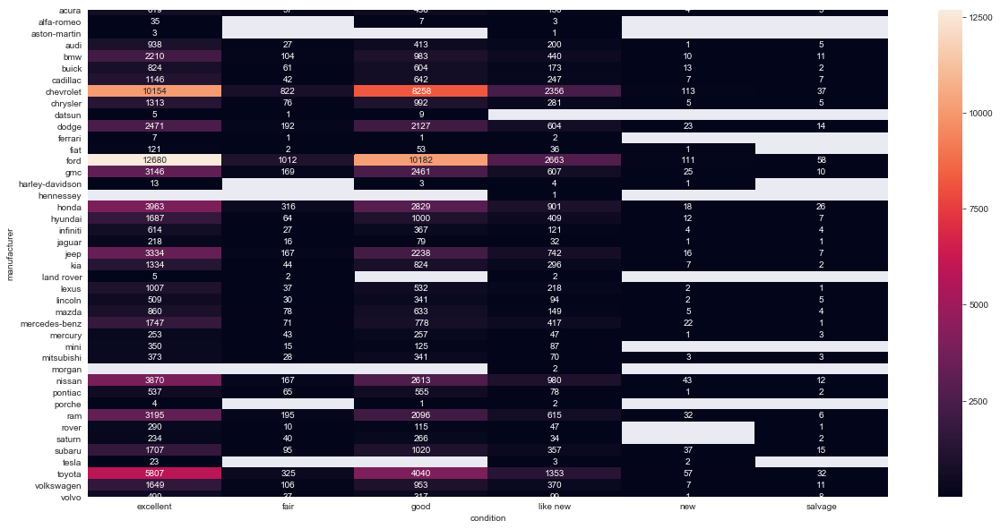

In [29]:
plt.figure(figsize=(20,10))
sns.heatmap(table, annot=True, fmt='g')
%config InlineBackend.figure_format = 'png'

## 7. Car distribution on map

Let's see car distribution on map for different types. We choose

In [31]:
df['type'].unique()

array(['hatchback', 'sedan', 'truck', 'coupe', 'van', 'SUV',
       'convertible', 'pickup', 'wagon', 'other', 'offroad', 'mini-van',
       'bus'], dtype=object)

In [39]:
df['type'].value_counts()

sedan          36584
SUV            35994
truck          23765
pickup         13659
coupe           7945
hatchback       5015
van             4693
mini-van        3698
wagon           3587
convertible     2956
other           1423
offroad          446
bus              204
Name: type, dtype: int64

We decided to choose sedan, bus and wagon types.

### Sedan

In [41]:
car_type = 'sedan'
fig = px.scatter_mapbox(df[df["type"] == car_type], lat="lat", lon="long", 
                        hover_name="paint_color", hover_data=["paint_color", "price"],
                        color_discrete_sequence=["fuchsia"], zoom=4, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Wagon

In [43]:
car_type = 'wagon'
fig = px.scatter_mapbox(df[df["type"] == car_type], lat="lat", lon="long", 
                        hover_name="paint_color", hover_data=["paint_color", "price"],
                        color_discrete_sequence=["fuchsia"], zoom=4, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Bus

In [44]:
car_type = 'bus'
fig = px.scatter_mapbox(df[df["type"] == car_type], lat="lat", lon="long", 
                        hover_name="paint_color", hover_data=["paint_color", "price"],
                        color_discrete_sequence=["fuchsia"], zoom=4, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()